In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats, integrate
from scipy.optimize import minimize_scalar
import matplotlib as mpl
import seaborn as sns
import koreanize_matplotlib


ilgan = pd.read_csv('일간기온전처리.csv', encoding='euc-kr')

ilgan.columns = ['날짜', '지점', '평균기온', '최저기온', '최고기온']
ilgan['날짜'] = ilgan['날짜'].str.replace('\t', '')
ilgan['날짜'] = pd.to_datetime(ilgan['날짜'], format='%Y-%m-%d')

ilgan = ilgan.drop(ilgan.index[15433:16463]) # 50~53년 결측치 제외
ilgan = ilgan.drop(ilgan.index[:92]) # 1907년 결측치 제외


In [125]:
ilgan['봄'] = ilgan['날짜'].dt.month.isin([3, 4, 5])
ilgan['여름'] = ilgan['날짜'].dt.month.isin([6, 7, 8])
ilgan['가을'] = ilgan['날짜'].dt.month.isin([9, 10, 11])
ilgan['겨울'] = ilgan['날짜'].dt.month.isin([1, 2, 12])

seasonal_avg_temps = ilgan.groupby(ilgan['날짜'].dt.year).agg({
    '봄': 'mean',
    '여름': 'mean',
    '가을': 'mean',
    '겨울': 'mean',
    '평균기온': ['mean', 'max', 'min'],
    '최고기온': 'max',
    '최저기온': 'min',
})

In [126]:

seasonal_avg_temps.columns = ['_'.join(col).strip() for col in seasonal_avg_temps.columns.values]

seasonal_avg_temps.head()

seasons = {
    '봄': [3, 4, 5],
    '여름': [6, 7, 8],
    '가을': [9, 10, 11],
    '겨울': [1, 2, 12],
}


In [127]:

seasonal_stats = {}

for season, months in seasons.items():
    season_data = ilgan[ilgan['날짜'].dt.month.isin(months)]
    stats = season_data.groupby(season_data['날짜'].dt.year).agg({
        '평균기온': ['mean', 'max', 'min'],
        '최고기온': 'max',
        '최저기온': 'min',
    })
    stats.columns = [f'{season}_{col[0]}_{col[1]}' for col in stats.columns.values]
    seasonal_stats[season] = stats

seasonal_stats_df = pd.concat(seasonal_stats.values(), axis=1)

seasonal_stats_df.head()


,봄_평균기온_mean,봄_평균기온_max,봄_평균기온_min,봄_최고기온_max,봄_최저기온_min,여름_평균기온_mean,여름_평균기온_max,여름_평균기온_min,여름_최고기온_max,여름_최저기온_min,가을_평균기온_mean,가을_평균기온_max,가을_평균기온_min,가을_최고기온_max,가을_최저기온_min,겨울_평균기온_mean,겨울_평균기온_max,겨울_평균기온_min,겨울_최고기온_max,겨울_최저기온_min
날짜,,,,,,,,,,,,,,,,,,,,
1908,9.268478,18.0,-3.8,25.2,-7.4,22.872826,27.5,17.6,33.6,11.6,12.195604,23.8,-4.3,28.7,-8.6,-2.751648,5.1,-10.4,11.7,-15.8
1909,9.182609,21.7,-3.5,29.8,-8.7,23.510870,29.7,18.0,35.6,11.2,12.524176,23.2,-5.4,29.5,-7.0,-3.058889,5.6,-10.7,11.0,-14.6
1910,9.556522,21.8,-3.7,31.0,-8.6,22.463043,28.4,15.8,33.3,12.4,12.781319,23.4,-3.3,27.0,-8.4,-3.427778,3.7,-15.4,8.3,-19.9
1911,9.671739,20.8,-2.2,30.0,-5.3,22.961957,28.7,16.8,34.5,10.7,12.773626,25.7,-2.2,32.8,-4.9,-3.063333,6.0,-15.6,12.5,-21.5
1912,9.538043,20.6,-2.2,29.7,-6.8,23.077174,28.4,17.8,34.0,12.3,10.062637,24.1,-5.6,32.2,-9.9,-2.318681,9.6,-12.7,14.7,-18.6


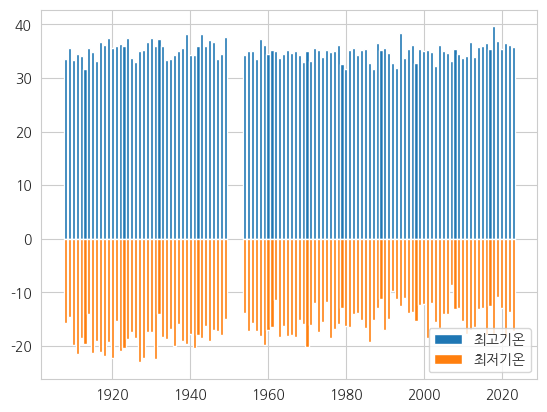

In [147]:

tmpmaxdf = ilgan.copy()
tmpmaxdf['년도'] = tmpmaxdf['날짜'].dt.year
tmpmaxcount = tmpmaxdf.groupby('년도').max()['최고기온']

plt.bar(tmpmaxcount.index, 
        tmpmaxcount,
        align='center',
        label = '최고기온')

tmpmindf = ilgan.copy()
tmpmindf['년도'] = tmpmindf['날짜'].dt.year
tmpmincount = tmpmindf.groupby('년도').min()['최저기온']

plt.bar(tmpmincount.index, 
        tmpmincount,
        align='center',
        label = '최저기온')

plt.legend()


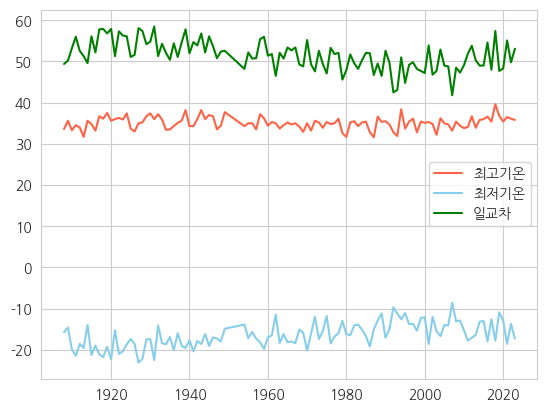

In [144]:
plt.plot(tmpmaxcount, color='tomato', label = '최고기온')
plt.plot(tmpmincount, color='skyblue', label = '최저기온')
plt.plot(tmpmaxcount-tmpmincount, color='green', label = '일교차')
plt.legend()

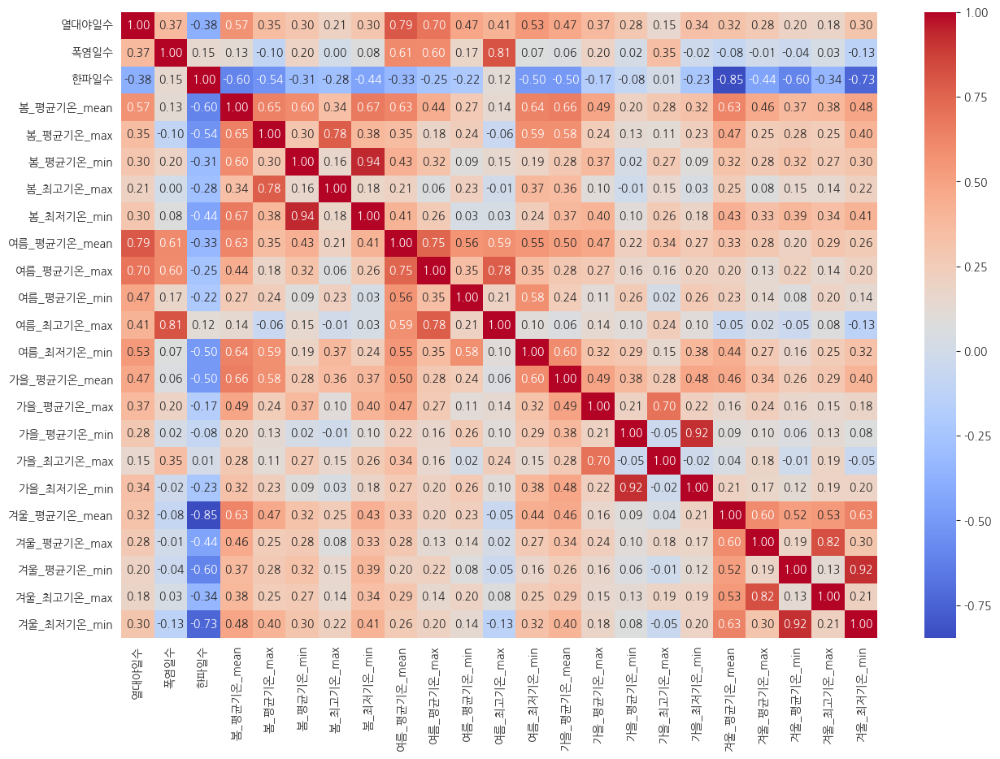

In [130]:
ilgan['년도'] = ilgan['날짜'].dt.year

pokdf = ilgan[ilgan['최고기온'] >= 33]
pokcount = pokdf.groupby('년도').size()

yeoldf = ilgan[ilgan['최저기온'] >= 25]
yeolcount = yeoldf.groupby('년도').size()

handf = ilgan[ilgan['최저기온'] <= -12]
hancount = handf.groupby('년도').size()

metrics_df = pd.DataFrame({
    '열대야일수': yeolcount,
    '폭염일수': pokcount,
    '한파일수': hancount
}).merge(seasonal_stats_df, left_index=True, right_index=True, how='outer')

metrics_df.fillna(0, inplace=True)

corr_matrix = metrics_df.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()



In [131]:
metrics_df1 = metrics_df.drop(['봄_평균기온_max', '봄_평균기온_min', '여름_평균기온_max', '여름_평균기온_min', '가을_평균기온_max', '가을_평균기온_min', '겨울_평균기온_max', '겨울_평균기온_min'], axis=1)
metrics_df1

,열대야일수,폭염일수,한파일수,봄_평균기온_mean,봄_최고기온_max,봄_최저기온_min,여름_평균기온_mean,여름_최고기온_max,여름_최저기온_min,가을_평균기온_mean,가을_최고기온_max,가을_최저기온_min,겨울_평균기온_mean,겨울_최고기온_max,겨울_최저기온_min
1908.0,0.0,3.0,11.0,9.268478,25.2,-7.4,22.872826,33.6,11.6,12.195604,28.7,-8.6,-2.751648,11.7,-15.8
1909.0,2.0,5.0,16.0,9.182609,29.8,-8.7,23.510870,35.6,11.2,12.524176,29.5,-7.0,-3.058889,11.0,-14.6
1910.0,2.0,1.0,16.0,9.556522,31.0,-8.6,22.463043,33.3,12.4,12.781319,27.0,-8.4,-3.427778,8.3,-19.9
1911.0,1.0,5.0,18.0,9.671739,30.0,-5.3,22.961957,34.5,10.7,12.773626,32.8,-4.9,-3.063333,12.5,-21.5
1912.0,0.0,3.0,17.0,9.538043,29.7,-6.8,23.077174,34.0,12.3,10.062637,32.2,-9.9,-2.318681,14.7,-18.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019.0,16.0,15.0,0.0,12.885870,33.4,-1.7,25.219565,36.8,14.1,15.540659,30.5,-4.6,0.485556,14.5,-10.9
2020.0,14.0,4.0,2.0,12.301087,30.0,-2.8,24.860870,35.4,14.8,14.567033,29.5,-3.6,1.241758,15.6,-12.9
2021.0,20.0,18.0,8.0,13.418478,30.8,-1.2,25.628261,36.5,13.3,15.451648,30.3,-3.7,0.234444,17.4,-18.6
2022.0,20.0,10.0,4.0,13.833696,30.7,-3.0,25.481522,36.1,14.9,15.637363,32.5,-8.1,-2.076667,11.5,-13.7


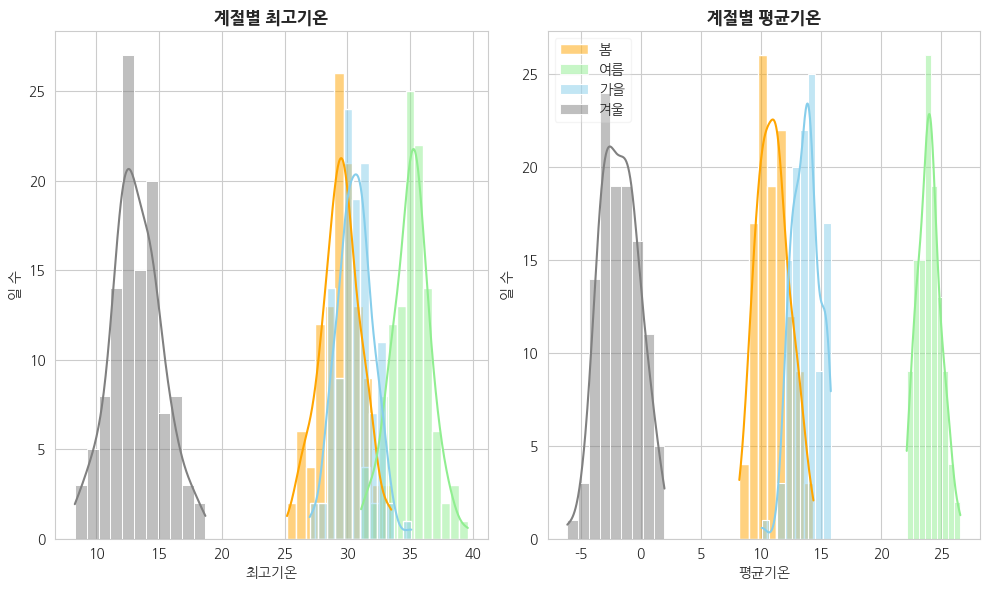

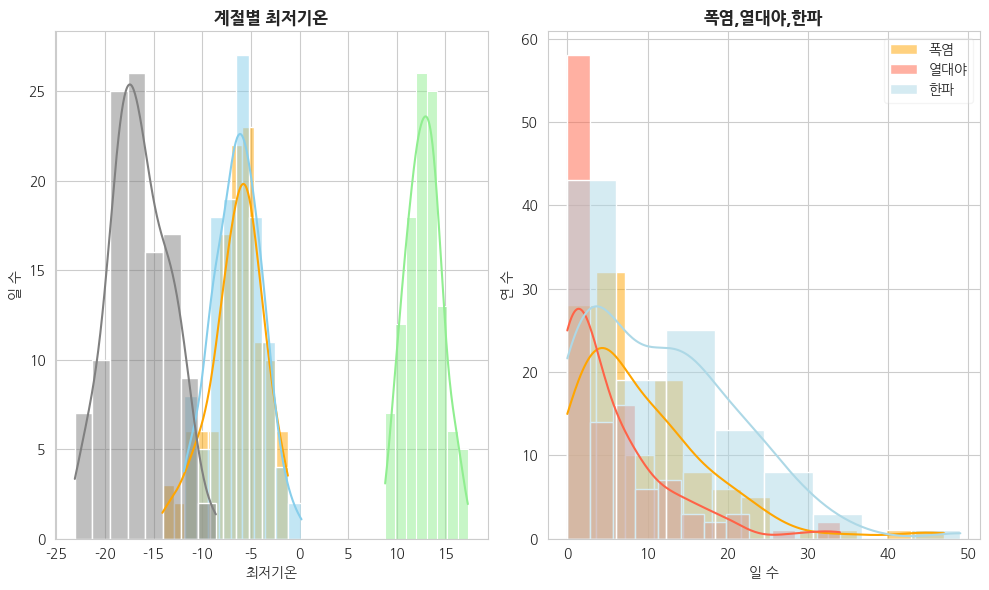

In [171]:
mpl.rcParams['legend.framealpha']=0.2
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
# plt.xlabel='최고기온'
# plt.legend()

sns.histplot(metrics_df['봄_최고기온_max'], kde=True, ax=ax[0], color='orange', label='봄')
sns.histplot(metrics_df['여름_최고기온_max'], kde=True, ax=ax[0], color='lightgreen', label='여름')
sns.histplot(metrics_df['가을_최고기온_max'], kde=True, ax=ax[0], color='skyblue', label='가을')
sns.histplot(metrics_df['겨울_최고기온_max'], kde=True, ax=ax[0], color='gray', label='겨울')
ax[0].set_xlabel('최고기온')
ax[0].set_ylabel('일 수')
# ax[0].legend(loc='upper center')
             
# sns.legend(title='계절')

ax[0].set_title('계절별 최고기온', weight='bold')

sns.histplot(metrics_df['봄_평균기온_mean'], kde=True, ax=ax[1], color='orange', label='봄')
sns.histplot(metrics_df['여름_평균기온_mean'], kde=True, ax=ax[1], color='lightgreen', label='여름')
sns.histplot(metrics_df['가을_평균기온_mean'], kde=True, ax=ax[1], color='skyblue', label='가을')
sns.histplot(metrics_df['겨울_평균기온_mean'], kde=True, ax=ax[1], color='gray', label='겨울')
ax[1].set_xlabel('평균기온')
ax[1].set_ylabel('일 수')
ax[1].legend(loc='upper left')

# sns.legend(title='계절')

ax[1].set_title('계절별 평균기온', weight='bold')
plt.tight_layout()

fig, ax = plt.subplots(1, 2, figsize=(10, 6))

sns.histplot(metrics_df['봄_최저기온_min'], kde=True, ax=ax[0], color='orange', label='봄')
sns.histplot(metrics_df['여름_최저기온_min'], kde=True, ax=ax[0], color='lightgreen', label='여름')
sns.histplot(metrics_df['가을_최저기온_min'], kde=True, ax=ax[0], color='skyblue', label='가을')
sns.histplot(metrics_df['겨울_최저기온_min'], kde=True, ax=ax[0], color='gray', label='겨울')
ax[0].set_xlabel('최저기온')
ax[0].set_ylabel('일 수')

# sns.legend(title='계절')

ax[0].set_title('계절별 최저기온', weight='bold')

sns.histplot(metrics_df['폭염일수'], kde=True, ax=ax[1], color='orange', label='폭염')
sns.histplot(metrics_df['열대야일수'], kde=True, ax=ax[1], color='tomato', label='열대야')
sns.histplot(metrics_df['한파일수'], kde=True, ax=ax[1], color='lightblue', label='한파')
# sns.legend(title='계절')
ax[1].set_xlabel('일 수')
ax[1].set_ylabel('연 수')
ax[1].set_title('폭염,열대야,한파', weight='bold')
ax[1].legend(loc='upper right')


plt.tight_layout()
plt.show()

mpl.rcParams['legend.framealpha']=0.8



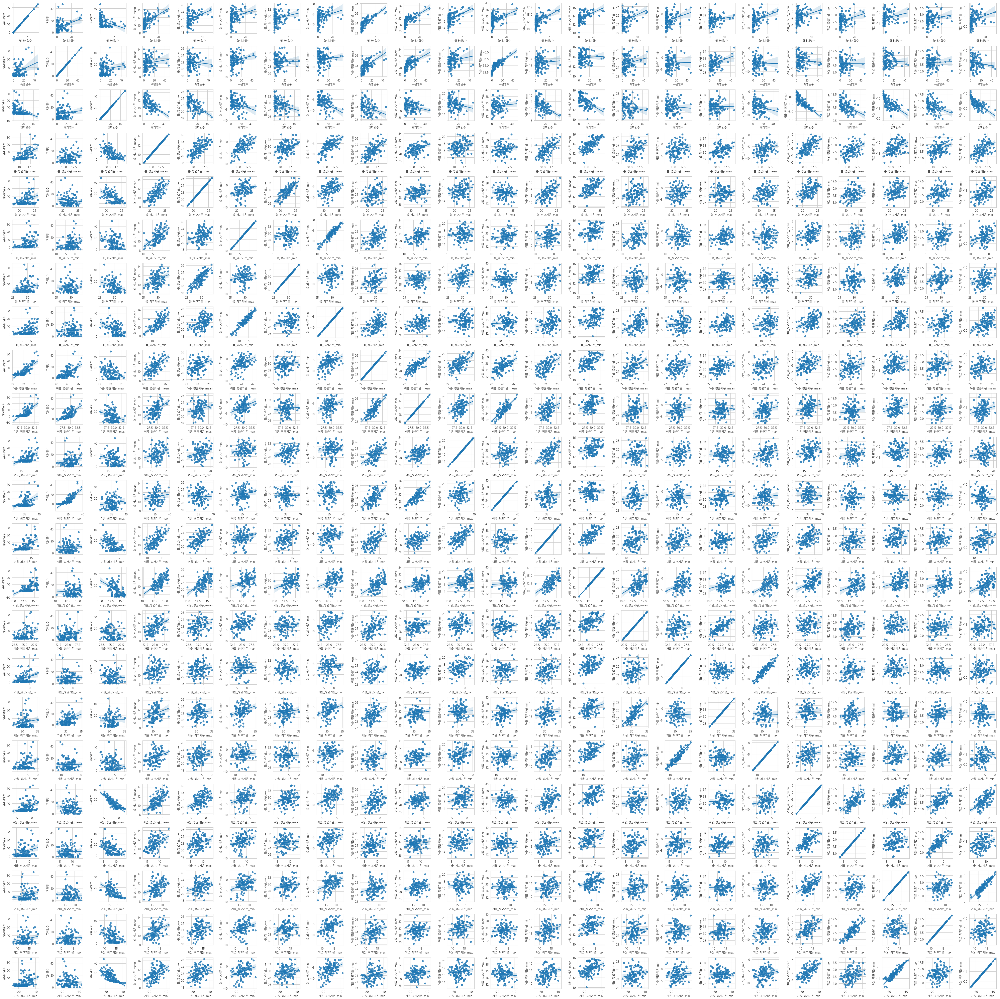

In [133]:


fig, ax = plt.subplots(23, 23, figsize=(50, 50))

for aidx, a in enumerate(list(metrics_df.columns)):
    for bidx, b in enumerate(list(metrics_df.columns)):
        sns.regplot(metrics_df, x=a, y=b, ax=ax[aidx][bidx])
        # ax[aidx][bidx].set_title(f'{a}' +' '+ f'{b}', fontdict={'weight': 'bold', 'size': '15'})
plt.tight_layout()
plt.show()
plt.close()







In [134]:
summerpok = pd.DataFrame({'최고기온':tmpmaxcount,'폭염일수':pokcount})
summerpok = summerpok.fillna(0)
summerpok

summeryeol = pd.DataFrame({'최고기온':tmpmaxcount,'열대야일수':yeolcount})
summeryeol

yeolpok = pd.DataFrame({'열대야일수':tmpmaxcount,'폭염일수':yeolcount})
yeolpok

winterhan = pd.DataFrame({'최저기온':tmpmincount, '한파일수':hancount})
winterhan = winterhan.fillna(0)
winterhan

,최저기온,한파일수
년도,,
1908.0,-15.8,11.0
1909.0,-14.6,16.0
1910.0,-19.9,16.0
1911.0,-21.5,18.0
1912.0,-18.6,17.0
...,...,...
2019.0,-10.9,0.0
2020.0,-12.9,2.0
2021.0,-18.6,8.0


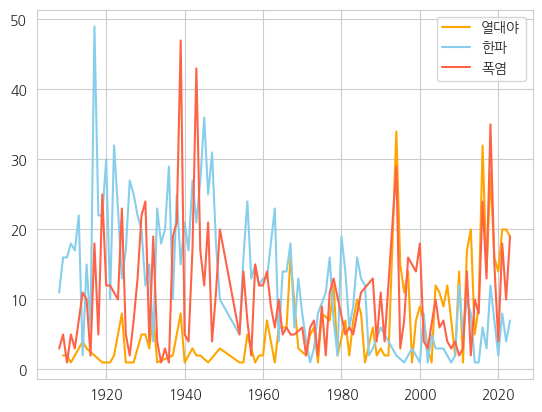

In [156]:
plt.plot(yeolcount, color='orange', label = '열대야')
plt.plot(hancount, color='skyblue', label = '한파')
plt.plot(pokcount, color='tomato', label = '폭염')
plt.legend()

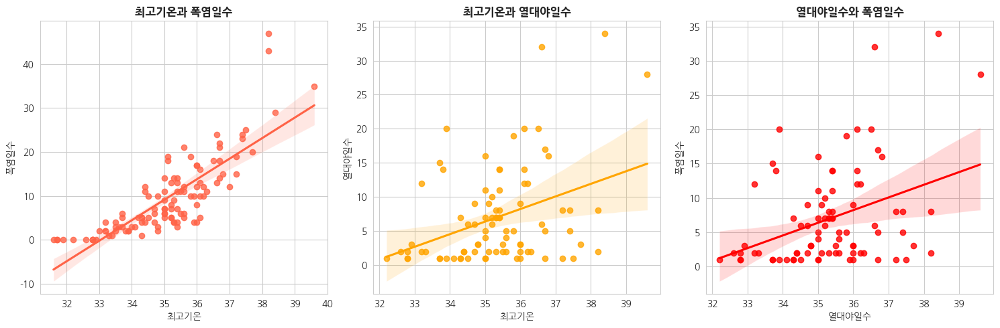

In [192]:
yeolhan = pd.DataFrame({'열대야일수':yeolcount,'한파일수':hancount})
yeolhan = yeolhan.fillna(0)
yeolhan

pokhan = pd.DataFrame({'폭염일수':pokcount, '한파일수':hancount})
pokhan = pokhan.fillna(0)
pokhan

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
sns.regplot(summerpok, x='최고기온', y='폭염일수', ax=ax[0], color='tomato')
ax[0].set_title('최고기온과 폭염일수', weight='bold') 
sns.regplot(summeryeol, x='최고기온', y='열대야일수', ax=ax[1], color='orange')
ax[1].set_title('최고기온과 열대야일수', weight='bold') 
sns.regplot(yeolpok, x='열대야일수', y='폭염일수', ax=ax[2], color='red')
ax[2].set_title('열대야일수와 폭염일수', weight='bold') 

plt.tight_layout()
plt.show()
plt.close()



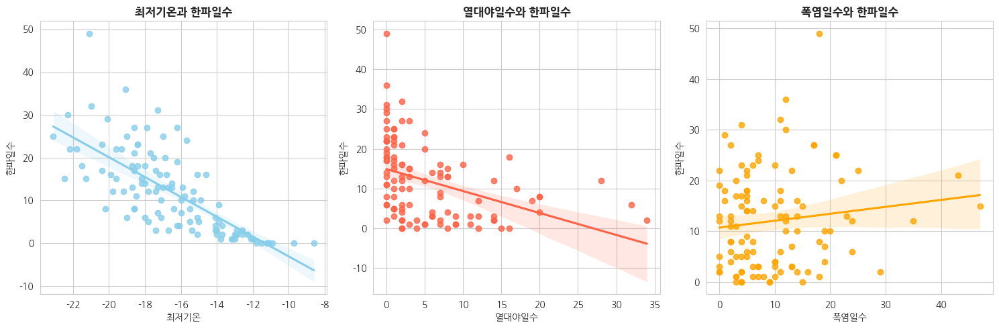

In [191]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

sns.regplot(winterhan, x='최저기온', y='한파일수', ax=ax[0], color='skyblue')
ax[0].set_title('최저기온과 한파일수', weight='bold') 
sns.regplot(yeolhan, x='열대야일수', y='한파일수', ax=ax[1], color='tomato')
ax[1].set_title('열대야일수와 한파일수', weight='bold') 
sns.regplot(pokhan, x='폭염일수', y='한파일수', ax=ax[2], color='orange')
ax[2].set_title('폭염일수와 한파일수', weight='bold') 

plt.tight_layout()
plt.show()
plt.close()
